In [10]:
#import the necessary libraries for this machine learning project
import os 
import tensorflow
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, MaxPooling2D, Conv2D, Flatten
from tensorflow.keras import Input, Model
import cv2
import matplotlib.pyplot as plt
import random
from tensorflow.keras.layers import Layer
import pandas as pd

In [14]:
#creates list of the folder names, the folder names are the classes for the images
def create_folder_list(src_directory):
    folder_list = [folder for folder in os.listdir(src_directory) if os.path.isdir(os.path.join(src_directory, folder))]
    
    return folder_list

In [15]:
#creates a dictionary where the key is the name of the folder, and the file path of each image is the value
def create_folder_dict(src_directory, folder_list):
    folder_dictionary = {}

    for i in folder_list:
        folder_name = f'{i}' #stores folder name as key

        folder_dictionary[folder_name] = os.path.join(src_directory, f'{i}') #creates a path for each image in folder
    
    return folder_dictionary

In [16]:
# displays the number of images per folder
def dict_number_of_documents(folder_dict):
    for key, value in folder_dict.items():
        print(f'There are {len(os.listdir(value))} {key} documents')

In [17]:
#displays a randomly selected image from each folder along with displaying the dimensions of each picture
def output_images_per_class(folder_dict, image_type, num_images):
    plt.figure(figsize=(8,8))
    for folder_name, folder_path in folder_dict.items():
        folder_image_list = [file for file in os.listdir(folder_path) if file.endswith(image_type)]
        random_image_list = random.sample(folder_image_list, num_images)

        for i in range(len(random_image_list)):
            image_join = os.path.join(folder_path, random_image_list[i])

            imread = cv2.imread(image_join)

            cvt_rgb = cv2.cvtColor(imread, cv2.COLOR_BGR2RGB)

            plt.imshow(cvt_rgb)
            plt.title(f'{folder_name} {i}')
            plt.axis('off')
            print(imread.shape)
            plt.show()

In [18]:
#resizes image to desired width and height
def resize_images(width, length, folder_dict, image_type):
    for name, path, in folder_dict.items():
        image_list = [file for file in os.listdir(path) if file.endswith('.jpeg') ]
        for i in range(len(image_list)):
            image_join = os.path.join(path, image_list[i])

            imread = cv2.imread(image_join)
            resize_image = cv2.resize(imread, (width, length))
            cv2.imwrite(image_join, resize_image)
            print('resizing image')
        print('resize complete')

In [19]:
#creates a generator for training and testing
def create_generators(train_directory, test_directory, batch_size, target_size, class_mode):
    #data augmentation is performed to create different variations of images to increase generalization
    train_gen = ImageDataGenerator(rescale=1./255, zoom_range=0.2, horizontal_flip=True, shear_range=0.2, rotation_range=40, width_shift_range=0.2)
    train_generator = train_gen.flow_from_directory(directory = train_directory, batch_size = batch_size, target_size= target_size, class_mode = class_mode)
    test_gen = ImageDataGenerator(rescale=1./255)
    test_generator = test_gen.flow_from_directory(directory = test_directory, batch_size = batch_size, target_size= target_size, class_mode = class_mode, shuffle = False )
    #Each generator is normalized to increase loss minimization
    return train_generator, test_generator

In [20]:
#A convolution block that contains a convolution layer followed by a max pooling layer
class Conv_Block(Layer):
    def __init__ (self, filters, kernel_size, activation = 'relu', **kwargs):
        super(Conv_Block, self).__init__(**kwargs)

        self.filters = filters
        self.kernel_size = kernel_size
        self.activation = activation

        self.conv = Conv2D(filters, kernel_size, padding = 'same')
        self.pool = MaxPooling2D(3)

    def call(self, inputs):
        x = self.conv(inputs)
        x = self.pool(x)
        return x 

In [11]:
#Directory to access the training data
train_dir = r'Financial Data_train'
#directory to access the testing data
test_dir = r'Financial_data_test'

In [21]:
#list of folder names for the training data created
train_folder_list = create_folder_list(train_dir)
print(train_folder_list)

['advertisement', 'budget', 'email', 'file folder', 'form', 'handwritten', 'invoice', 'letter', 'memo', 'news article', 'presentation', 'questionnaire', 'resume', 'scientific publication', 'scientific report', 'specification']


In [22]:
#List of folder names for the testing data created
test_folder_list = create_folder_list(test_dir)
print(test_folder_list)

['advertisement', 'budget', 'email', 'file folder', 'form', 'handwritten', 'invoice', 'letter', 'memo', 'news article', 'presentation', 'questionnaire', 'resume', 'scientific publication', 'scientific report', 'specification']


In [23]:
#Creates a dictionary for training data and its image file paths
train_folder_dict = create_folder_dict(train_dir, train_folder_list)

print(train_folder_dict)

{'advertisement': 'Financial Data_train\\advertisement', 'budget': 'Financial Data_train\\budget', 'email': 'Financial Data_train\\email', 'file folder': 'Financial Data_train\\file folder', 'form': 'Financial Data_train\\form', 'handwritten': 'Financial Data_train\\handwritten', 'invoice': 'Financial Data_train\\invoice', 'letter': 'Financial Data_train\\letter', 'memo': 'Financial Data_train\\memo', 'news article': 'Financial Data_train\\news article', 'presentation': 'Financial Data_train\\presentation', 'questionnaire': 'Financial Data_train\\questionnaire', 'resume': 'Financial Data_train\\resume', 'scientific publication': 'Financial Data_train\\scientific publication', 'scientific report': 'Financial Data_train\\scientific report', 'specification': 'Financial Data_train\\specification'}


In [24]:
#Creates a dictionary for testing data and its image file paths
test_folder_dict = create_folder_dict(test_dir, test_folder_list)
print(test_folder_dict)

{'advertisement': 'Financial_data_test\\advertisement', 'budget': 'Financial_data_test\\budget', 'email': 'Financial_data_test\\email', 'file folder': 'Financial_data_test\\file folder', 'form': 'Financial_data_test\\form', 'handwritten': 'Financial_data_test\\handwritten', 'invoice': 'Financial_data_test\\invoice', 'letter': 'Financial_data_test\\letter', 'memo': 'Financial_data_test\\memo', 'news article': 'Financial_data_test\\news article', 'presentation': 'Financial_data_test\\presentation', 'questionnaire': 'Financial_data_test\\questionnaire', 'resume': 'Financial_data_test\\resume', 'scientific publication': 'Financial_data_test\\scientific publication', 'scientific report': 'Financial_data_test\\scientific report', 'specification': 'Financial_data_test\\specification'}


In [25]:
#displays the number of images in the training per folder/class
dict_number_of_documents(train_folder_dict)

There are 2994 advertisement documents
There are 3002 budget documents
There are 2993 email documents
There are 3003 file folder documents
There are 2994 form documents
There are 3005 handwritten documents
There are 2992 invoice documents
There are 3015 letter documents
There are 2996 memo documents
There are 3001 news article documents
There are 3006 presentation documents
There are 3007 questionnaire documents
There are 3004 resume documents
There are 2985 scientific publication documents
There are 2999 scientific report documents
There are 3000 specification documents


In [26]:
#Displays the number of images in the testing per folder/class
dict_number_of_documents(test_folder_dict)

There are 2515 advertisement documents
There are 2505 budget documents
There are 2516 email documents
There are 2527 file folder documents
There are 2506 form documents
There are 2532 handwritten documents
There are 2477 invoice documents
There are 2464 letter documents
There are 2492 memo documents
There are 2463 news article documents
There are 2489 presentation documents
There are 2435 questionnaire documents
There are 2536 resume documents
There are 2569 scientific publication documents
There are 2498 scientific report documents
There are 2472 specification documents


(224, 224, 3)


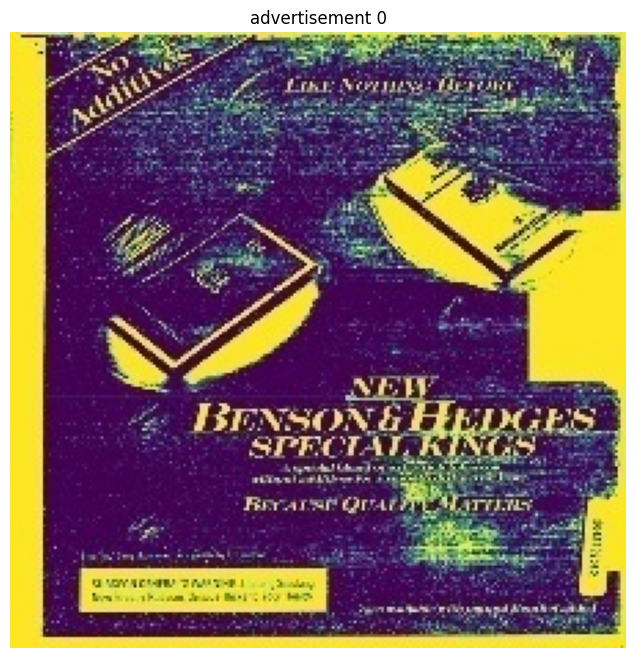

(224, 224, 3)


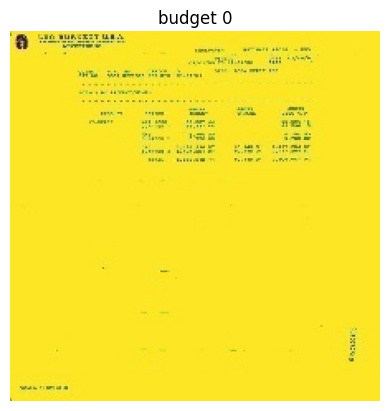

(224, 224, 3)


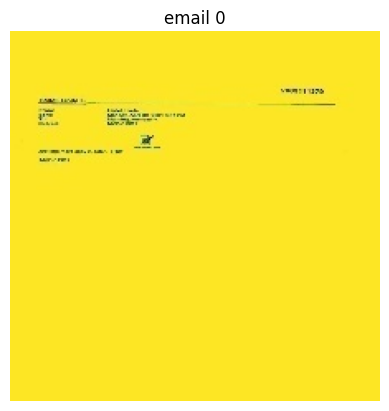

(224, 224, 3)


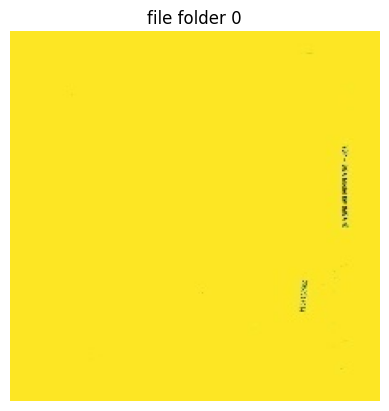

(224, 224, 3)


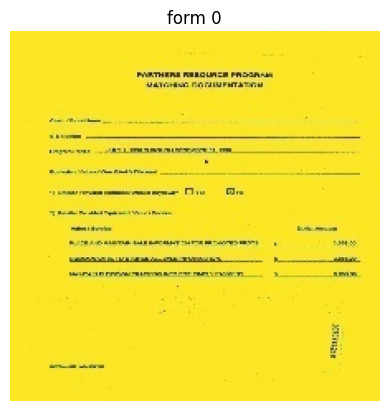

(224, 224, 3)


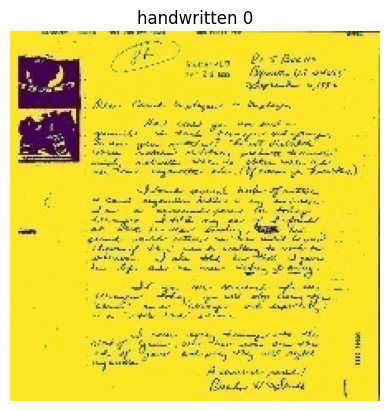

(224, 224, 3)


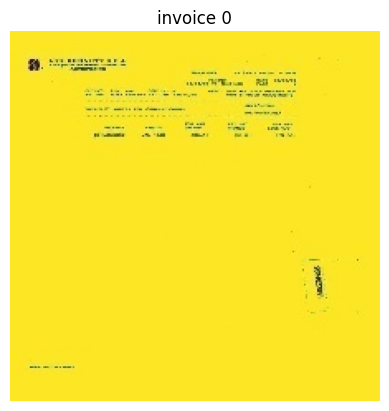

(224, 224, 3)


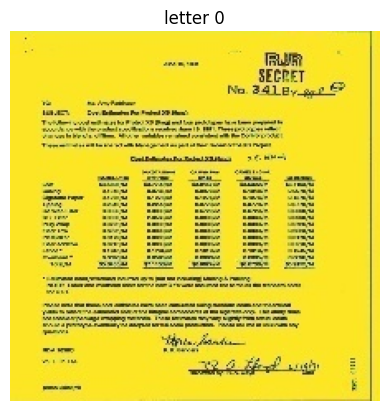

(224, 224, 3)


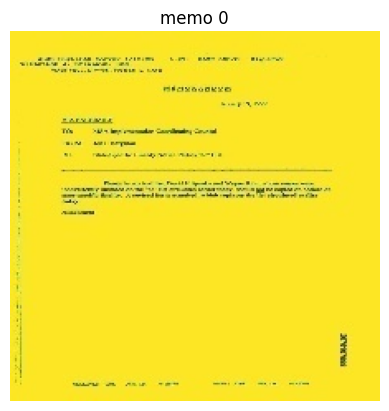

(224, 224, 3)


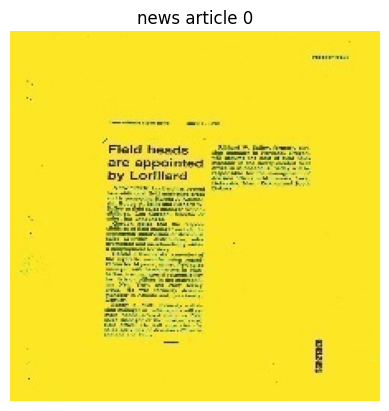

(224, 224, 3)


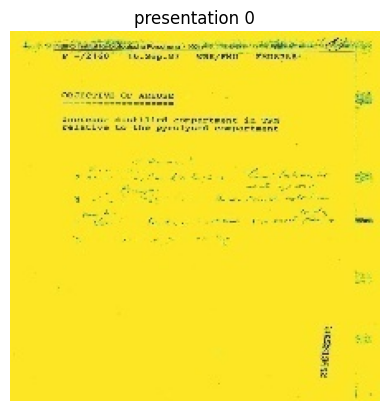

(224, 224, 3)


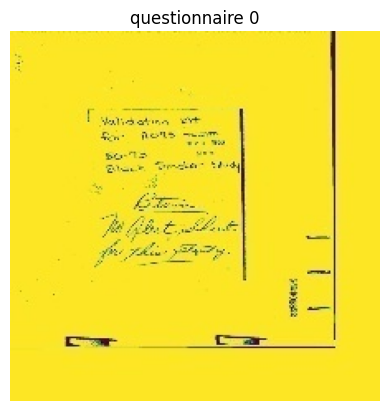

(224, 224, 3)


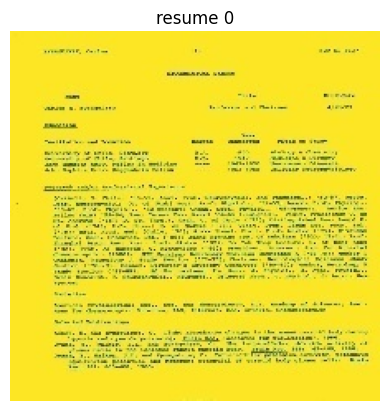

(224, 224, 3)


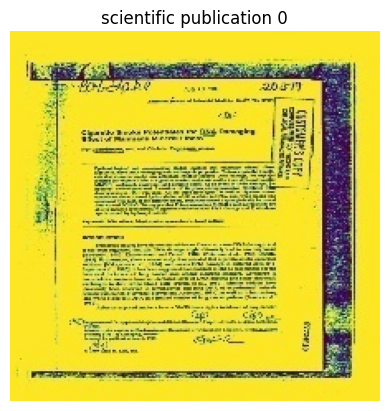

(224, 224, 3)


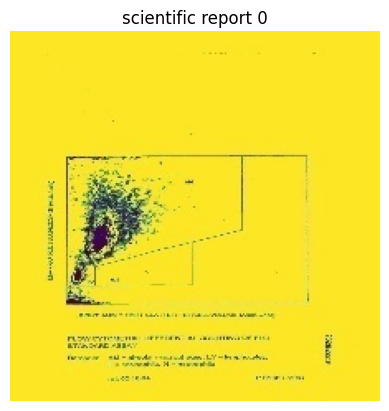

(224, 224, 3)


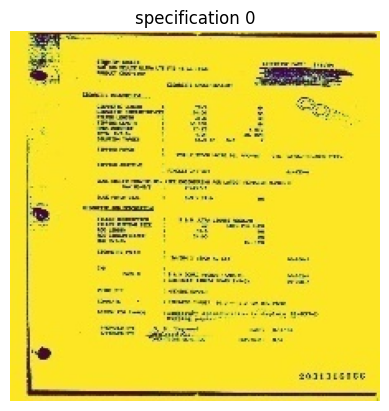

In [27]:
#displays images from the training
output_images_per_class(train_folder_dict, 'jpeg', 1)


(224, 224, 3)


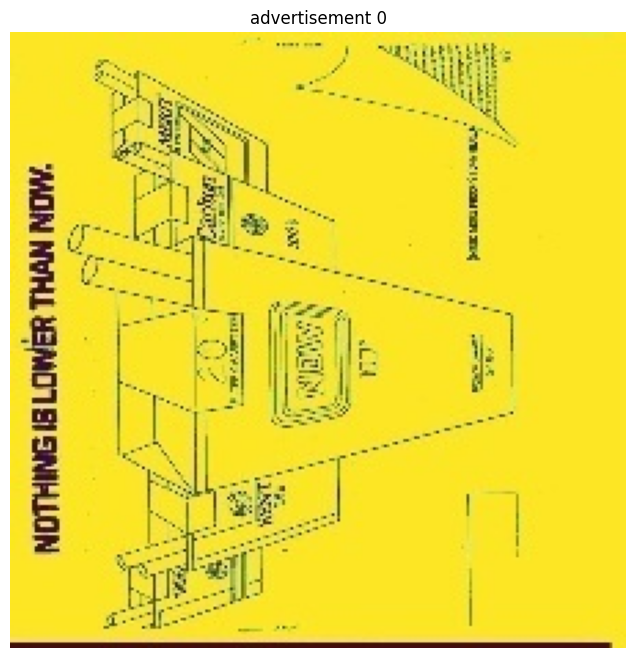

(224, 224, 3)


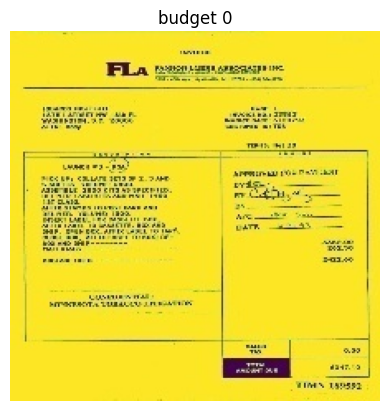

(224, 224, 3)


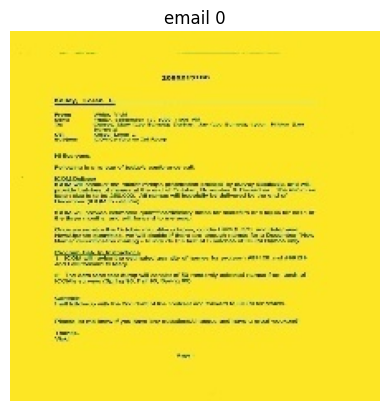

(224, 224, 3)


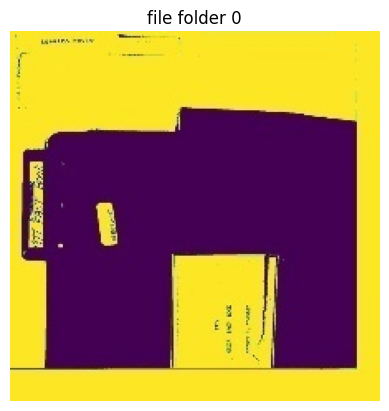

(224, 224, 3)


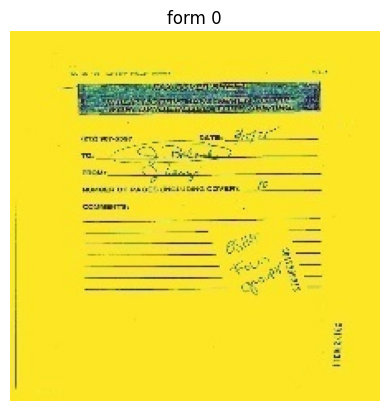

(224, 224, 3)


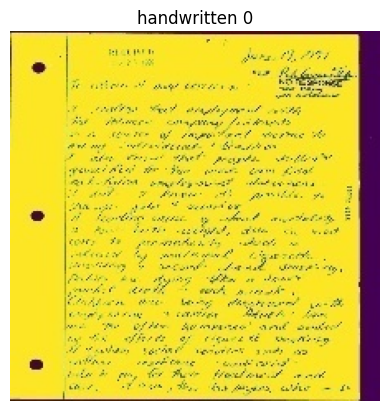

(224, 224, 3)


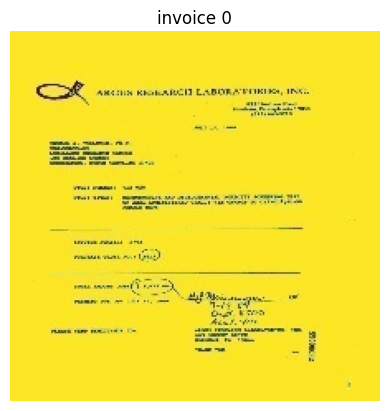

(224, 224, 3)


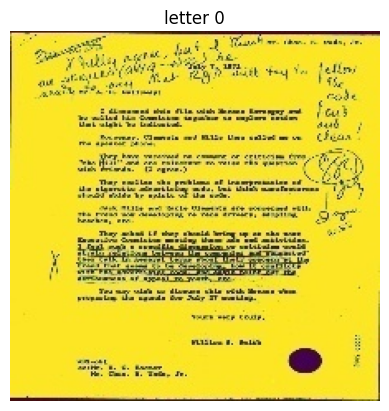

(224, 224, 3)


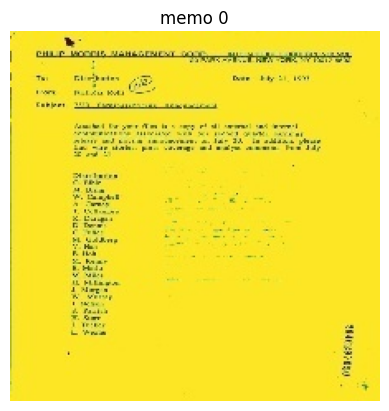

(224, 224, 3)


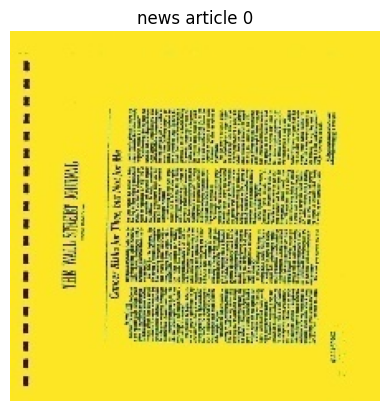

(224, 224, 3)


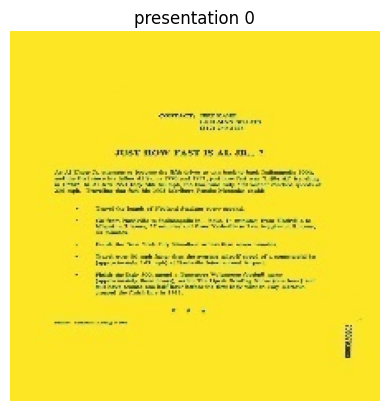

(224, 224, 3)


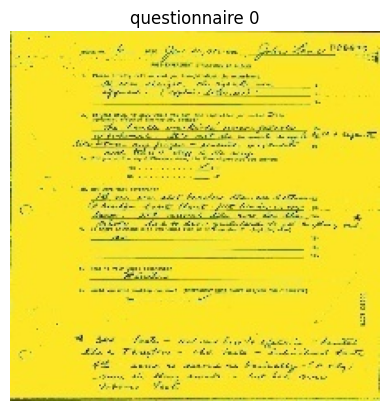

(224, 224, 3)


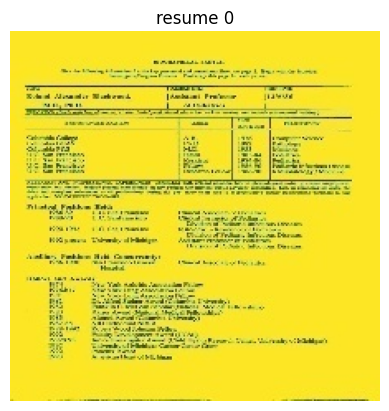

(224, 224, 3)


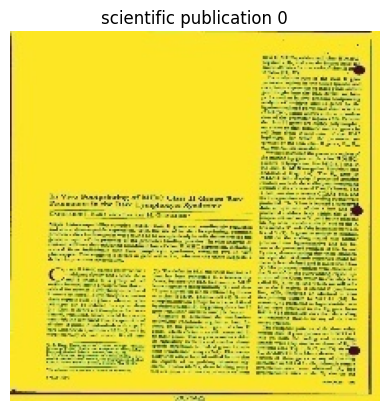

(224, 224, 3)


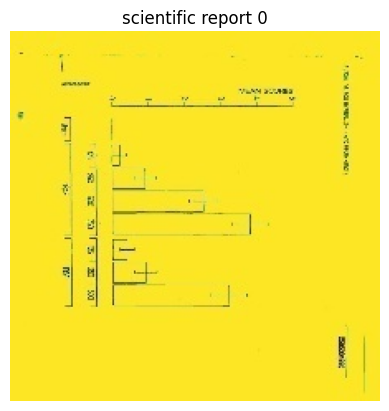

(224, 224, 3)


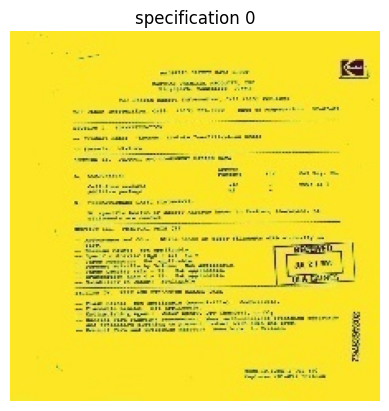

In [28]:
output_images_per_class(test_folder_dict, 'jpeg', 1)

(224, 224, 3)


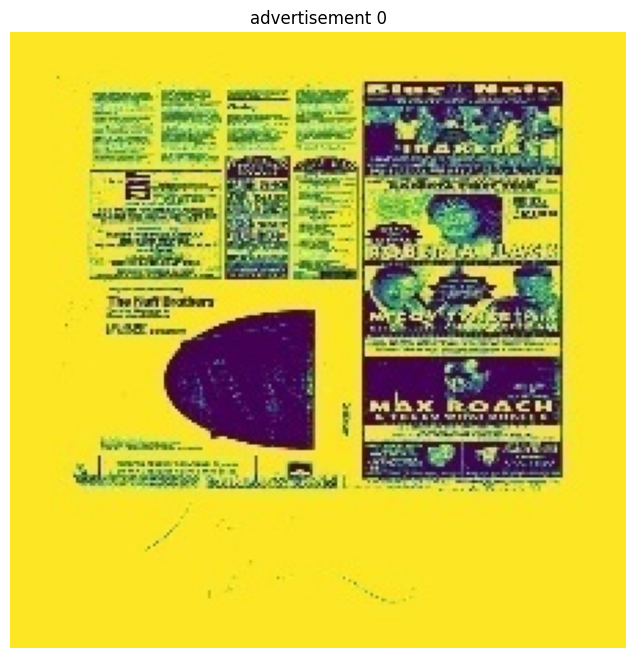

(224, 224, 3)


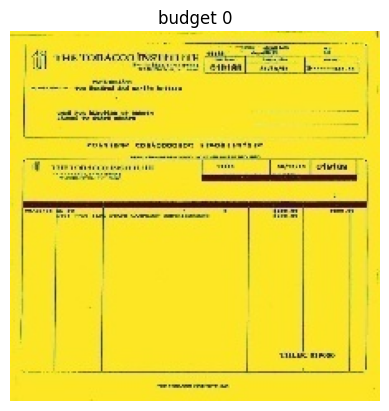

(224, 224, 3)


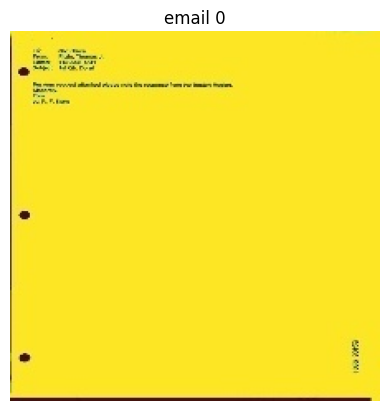

(224, 224, 3)


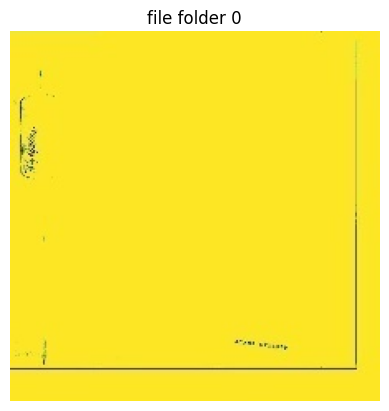

(224, 224, 3)


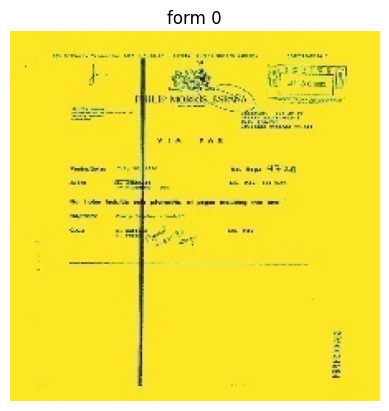

(224, 224, 3)


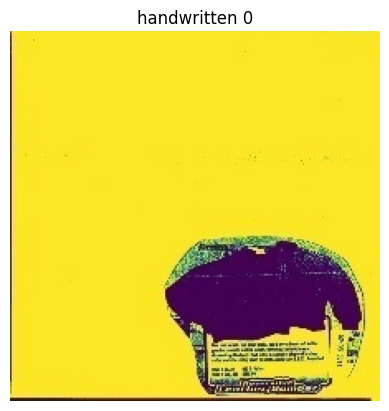

(224, 224, 3)


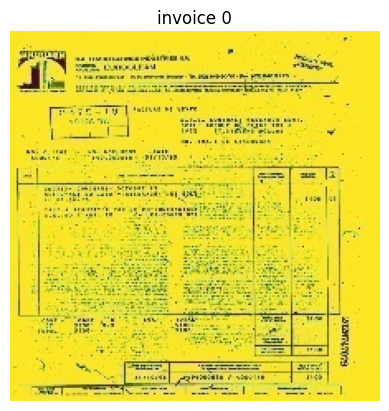

(224, 224, 3)


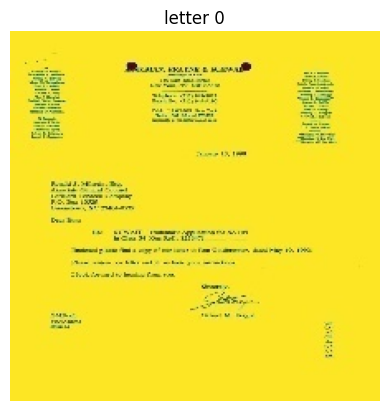

(224, 224, 3)


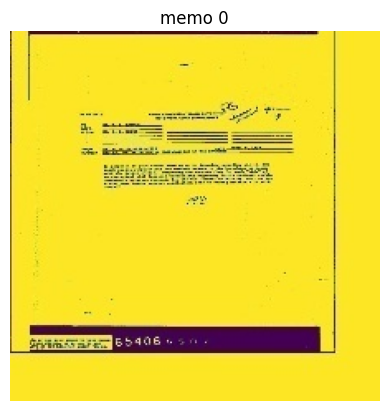

(224, 224, 3)


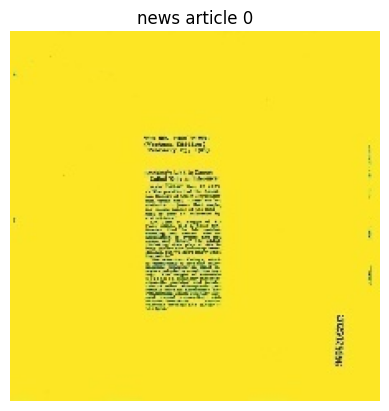

(224, 224, 3)


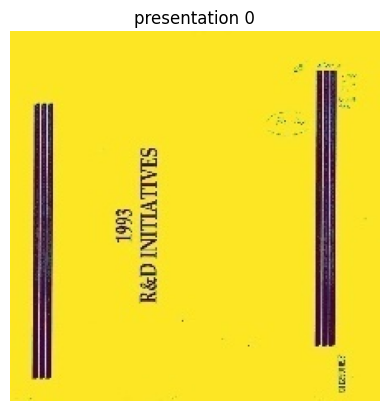

(224, 224, 3)


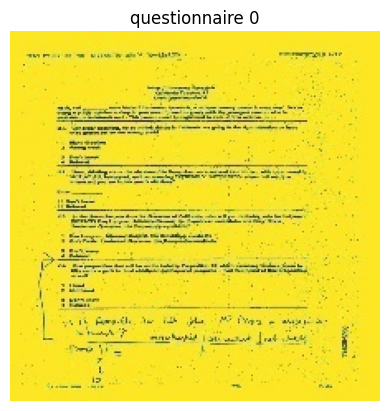

(224, 224, 3)


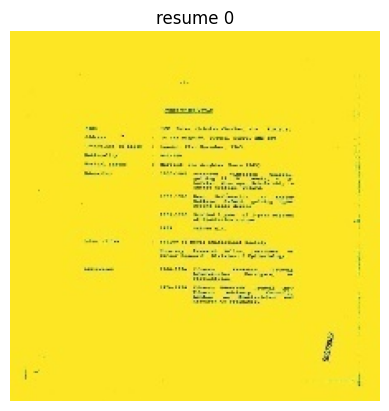

(224, 224, 3)


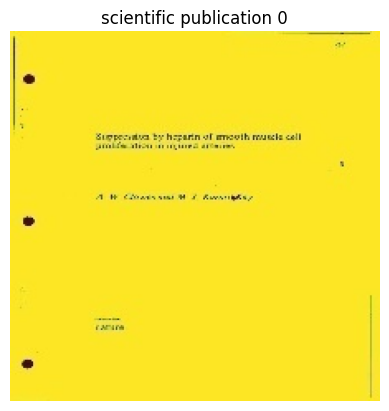

(224, 224, 3)


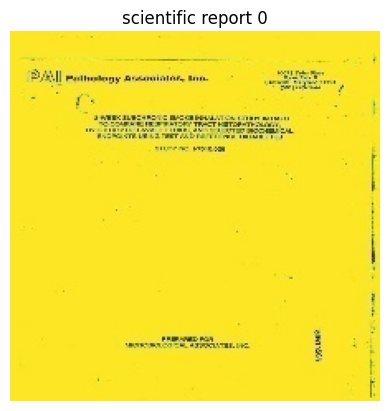

(224, 224, 3)


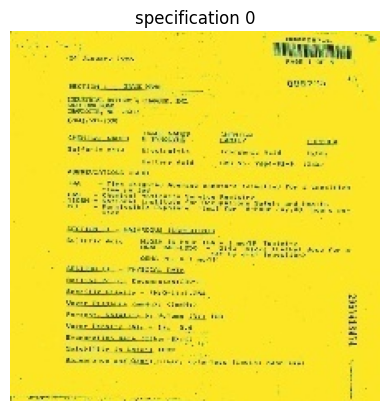

In [29]:
#Displays images from the testing
output_images_per_class(test_folder_dict, 'jpeg', 1)

In [30]:
#Resizes the images to 224X224
resize_images(224, 224, train_folder_dict, '.jpeg')
#*** This code was reran, the images were in different dimensions at first instead of 224x224

resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing i

In [31]:
#Resizes the images to 224X224
resize_images(224, 224, test_folder_dict, '.jpeg')
#*** This code was reran, the images were in different dimensions at first instead of 224x224

resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing image
resizing i

(224, 224, 3)


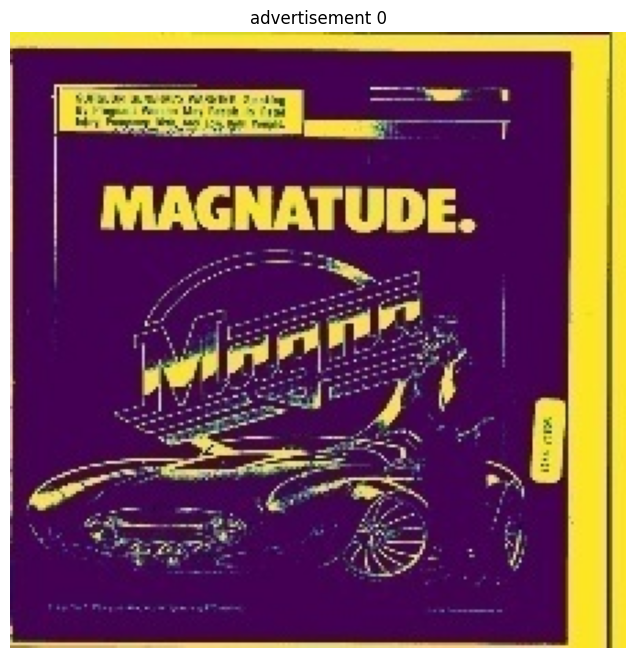

(224, 224, 3)


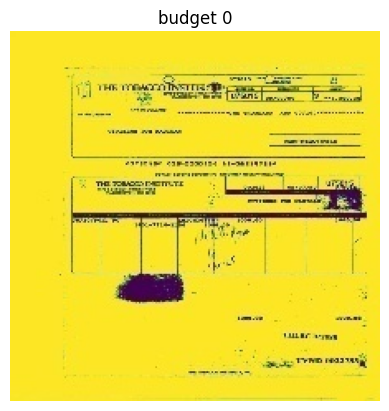

(224, 224, 3)


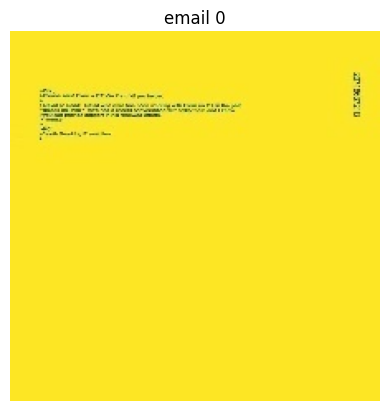

(224, 224, 3)


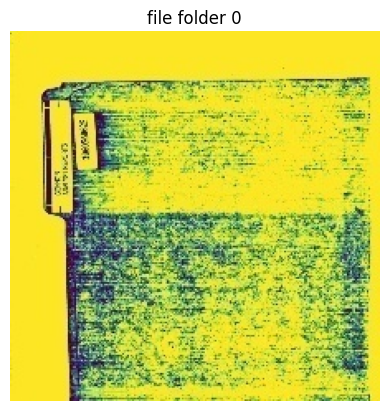

(224, 224, 3)


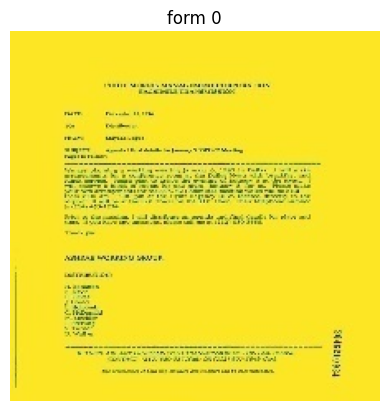

(224, 224, 3)


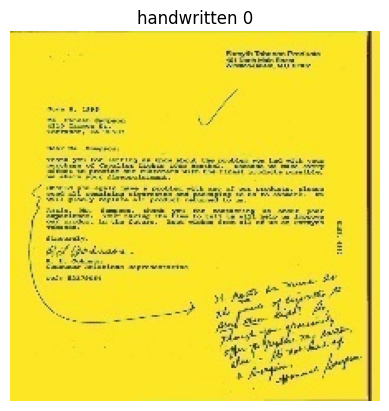

(224, 224, 3)


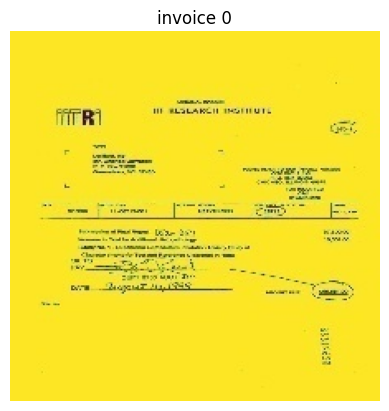

(224, 224, 3)


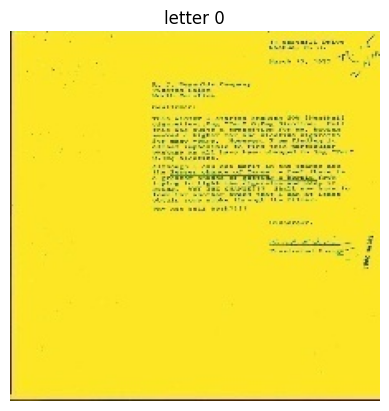

(224, 224, 3)


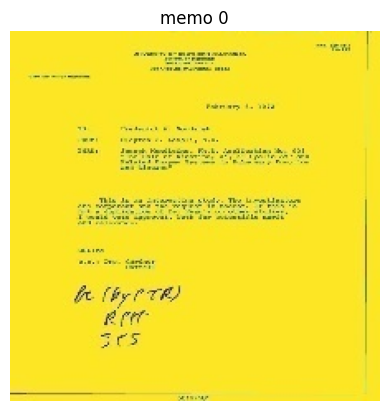

(224, 224, 3)


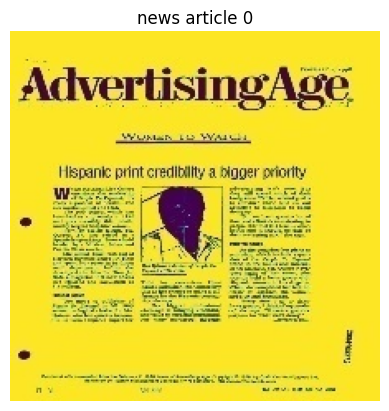

(224, 224, 3)


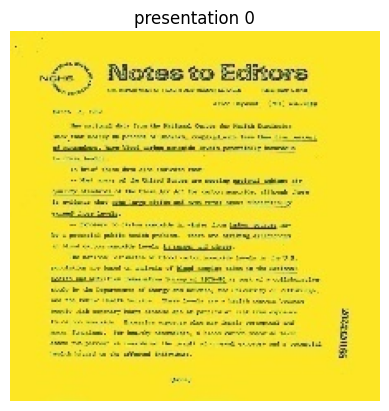

(224, 224, 3)


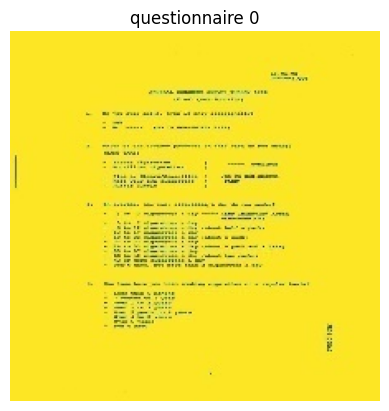

(224, 224, 3)


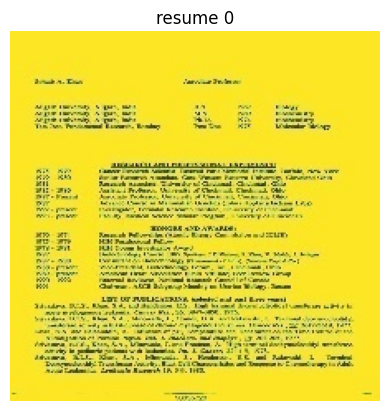

(224, 224, 3)


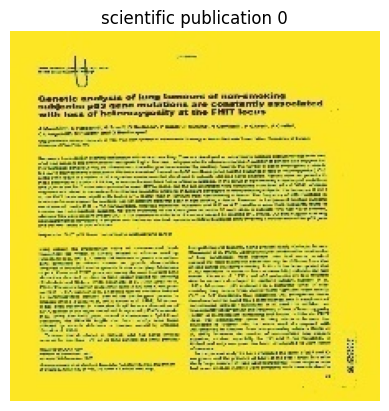

(224, 224, 3)


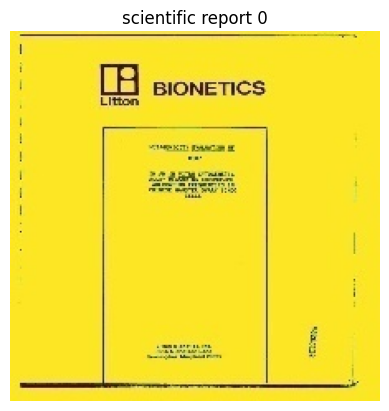

(224, 224, 3)


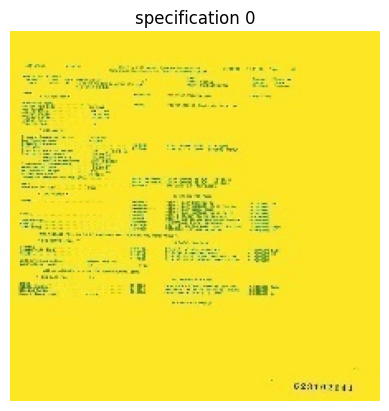

In [32]:
#resized images are displayed from the training data
output_images_per_class(train_folder_dict, '.jpeg', 1)

(224, 224, 3)


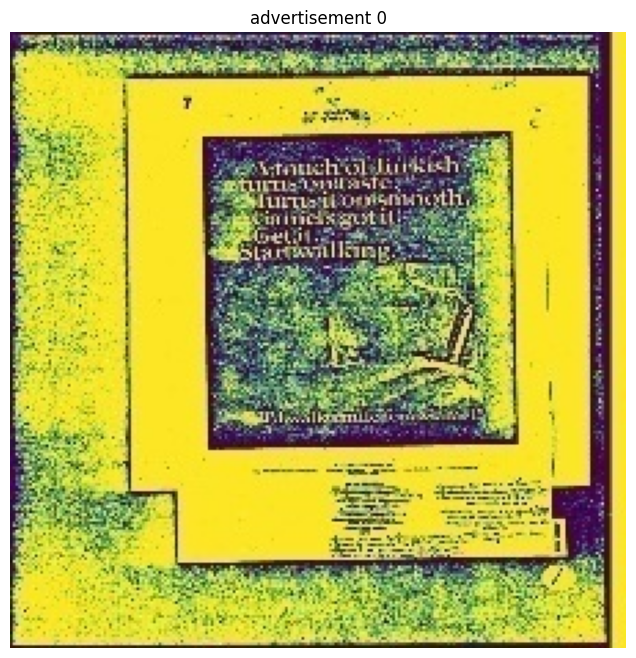

(224, 224, 3)


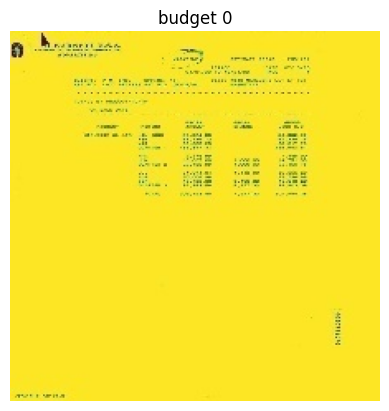

(224, 224, 3)


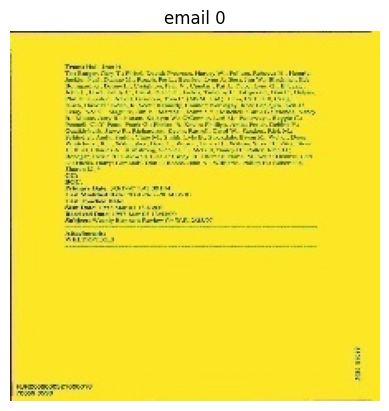

(224, 224, 3)


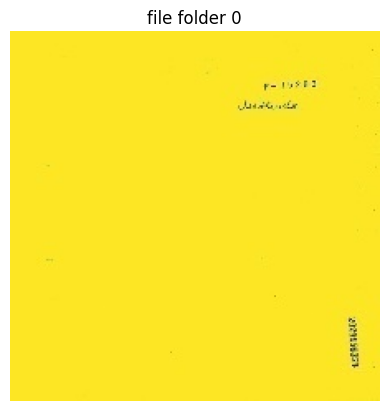

(224, 224, 3)


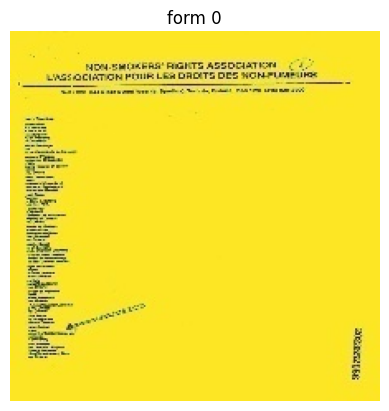

(224, 224, 3)


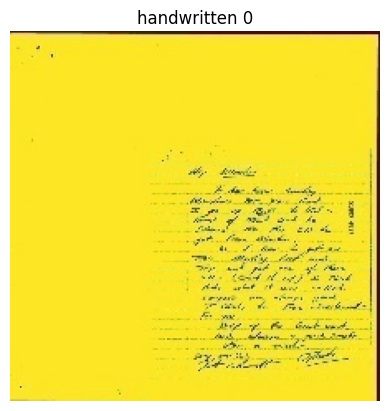

(224, 224, 3)


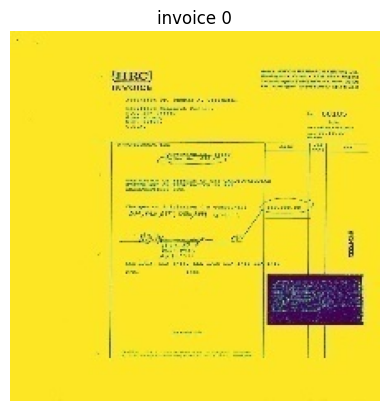

(224, 224, 3)


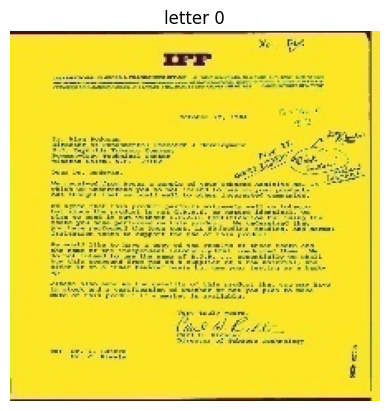

(224, 224, 3)


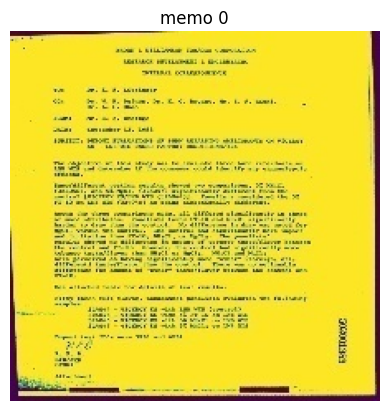

(224, 224, 3)


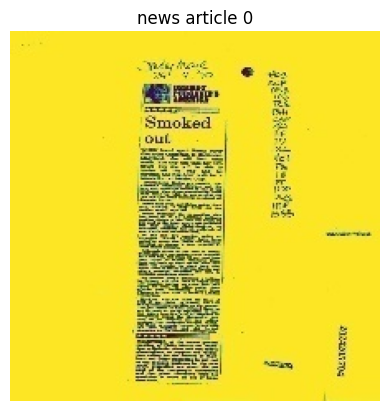

(224, 224, 3)


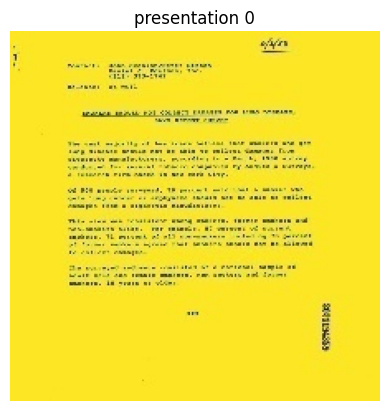

(224, 224, 3)


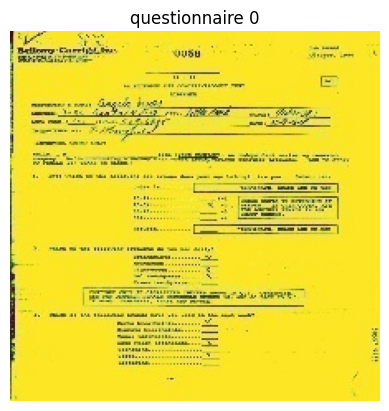

(224, 224, 3)


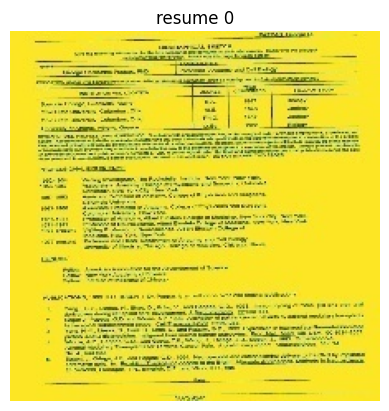

(224, 224, 3)


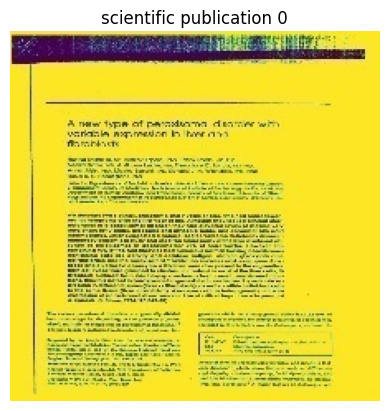

(224, 224, 3)


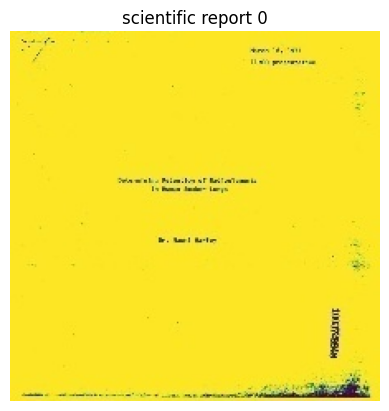

(224, 224, 3)


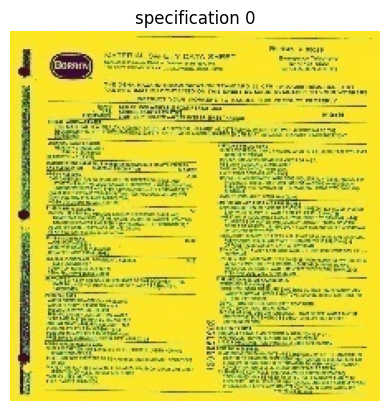

In [33]:
#Resized images are displayed from the testing data
output_images_per_class(test_folder_dict, '.jpeg', 1)

In [34]:
train_generator, test_generator = create_generators(train_dir, test_dir, batch_size=512, target_size=(224,224), class_mode='categorical')

Found 47996 images belonging to 16 classes.
Found 39996 images belonging to 16 classes.


In [9]:
#Model 1 is a fully connected neuron network with 1 hidden layer
model_1_input = Input(shape = (224, 224,3))

model_1_f = Flatten()(model_1_input)
model_1_x1 = Dense(100, activation = 'relu')(model_1_f)
model_1_output = Dense(16, activation = 'softmax')(model_1_x1)

model_1 = Model(inputs = model_1_input, outputs = model_1_output)

model_1.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['acc'])

model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 flatten (Flatten)           (None, 150528)            0         
                                                                 
 dense (Dense)               (None, 100)               15052900  
                                                                 
 dense_1 (Dense)             (None, 16)                1616      
                                                                 
Total params: 15054516 (57.43 MB)
Trainable params: 15054516 (57.43 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [35]:
model_1.fit(train_generator, epochs=75, validation_data=test_generator, verbose=1)

Epoch 1/75
94/94 [==============================] - 576s 6s/step - loss: 18.6338 - acc: 0.0609 - val_loss: 2.7727 - val_acc: 0.0629
Epoch 2/75
94/94 [==============================] - 281s 3s/step - loss: 2.7727 - acc: 0.0615 - val_loss: 2.7727 - val_acc: 0.0618
Epoch 3/75
94/94 [==============================] - 276s 3s/step - loss: 2.7726 - acc: 0.0617 - val_loss: 2.7727 - val_acc: 0.0629
Epoch 4/75
94/94 [==============================] - 273s 3s/step - loss: 2.7726 - acc: 0.0622 - val_loss: 2.7727 - val_acc: 0.0618
Epoch 5/75
94/94 [==============================] - 265s 3s/step - loss: 2.7726 - acc: 0.0611 - val_loss: 2.7726 - val_acc: 0.0618
Epoch 6/75
94/94 [==============================] - 250s 3s/step - loss: 2.7726 - acc: 0.0620 - val_loss: 2.7726 - val_acc: 0.0618
Epoch 7/75
94/94 [==============================] - 246s 3s/step - loss: 2.7726 - acc: 0.0602 - val_loss: 2.7726 - val_acc: 0.0616
Epoch 8/75
94/94 [==============================] - 246s 3s/step - loss: 2.7726 - 

In [47]:
#Model 2 is a neural network with 3 convolution blocks followed by fully connected layer that consisted of 3 hidden layers


model_2_inputs = Input(shape = (224, 224,3))
x = Conv_Block(60, 3, activation='relu')(model_2_inputs)
x = Conv_Block(120, 3, activation='relu')(x)
x = Conv_Block(180,3, activation='relu')(x)
x = Flatten()(x)
x = Dense(2048, activation = 'relu')(x)
x = Dense(1024, activation = 'relu')(x)
x = Dense(512, activation = 'relu')(x)
model_2_outputs = Dense(16, activation = 'softmax')(x)

model_2 = Model(inputs = model_2_inputs, outputs = model_2_outputs)

model_2.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['AUC', 'acc'])

model_2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv__block_5 (Conv_Block)  (None, 74, 74, 60)        1680      
                                                                 
 conv__block_6 (Conv_Block)  (None, 24, 24, 120)       64920     
                                                                 
 conv__block_7 (Conv_Block)  (None, 8, 8, 180)         194580    
                                                                 
 flatten_3 (Flatten)         (None, 11520)             0         
                                                                 
 dense_6 (Dense)             (None, 2048)              23595008  
                                                                 
 dense_7 (Dense)             (None, 1024)              2098

In [49]:
model_2.fit(train_generator, epochs = 40, validation_data = test_generator, verbose = 1)

Epoch 1/40
94/94 [==============================] - 1600s 17s/step - loss: 0.9790 - auc: 0.9624 - acc: 0.6965 - val_loss: 1.1258 - val_auc: 0.9486 - val_acc: 0.6708
Epoch 2/40
94/94 [==============================] - 1577s 17s/step - loss: 0.9640 - auc: 0.9636 - acc: 0.7006 - val_loss: 1.1326 - val_auc: 0.9486 - val_acc: 0.6721
Epoch 3/40
94/94 [==============================] - 1578s 17s/step - loss: 0.9319 - auc: 0.9658 - acc: 0.7094 - val_loss: 1.1407 - val_auc: 0.9477 - val_acc: 0.6720
Epoch 4/40
94/94 [==============================] - 1603s 17s/step - loss: 0.9180 - auc: 0.9669 - acc: 0.7137 - val_loss: 1.0858 - val_auc: 0.9519 - val_acc: 0.6887
Epoch 5/40
94/94 [==============================] - 1584s 17s/step - loss: 0.9031 - auc: 0.9678 - acc: 0.7171 - val_loss: 1.1481 - val_auc: 0.9469 - val_acc: 0.6663
Epoch 6/40
94/94 [==============================] - 1571s 17s/step - loss: 0.8724 - auc: 0.9697 - acc: 0.7256 - val_loss: 1.2614 - val_auc: 0.9389 - val_acc: 0.6578
Epoch 7/40